In [18]:
using Distributions
using AlphaStableDistributions
using Statistics
using Plots
using Random

In [2]:
"Generates a single levy trial for plotting."
function plot_levy_trial(a_l::Float64, zr_l::Float64, v_l::Float64, t0_l::Float64, alpha_l::Float64, sz::Float64, sv::Float64, st::Float64, dt=0.001, tol=1e5)
    
    # Declare variables
    n_steps = 0 # start at time 0
    rho = dt ^ (1.0/alpha_l) # Scaling factor -> how far into the trial is the current step

    # Include parameter variabilities (last terms serve to randomize direction of variability)
    zr_l = zr_l - 0.5*sz + sz * rand() # draw zr from uniform block between 0 and 1
    t0_l = t0_l - 0.5*st + st * rand() # draw t0 from uniform block between 0 and 1
    v_l = v_l + sv * rand(Normal()) # draw drift rate from Gaussian centered at v

    x = a_l * zr_l # scale trial starting point by respective threshold

    d = Any[]

    # Simulate single DM path
    while (x < a_l) && (x > 0) && (n_steps < tol) # as long as no decision boundary or the max. amount of steps is reached
        x += dt*v_l + rho * rand(AlphaStable(α=alpha_l, β=0.0, scale=1.0, location=0.0))
        push!(d,x)
        n_steps += 1
    end
    
    return d
end

plot_levy_trial

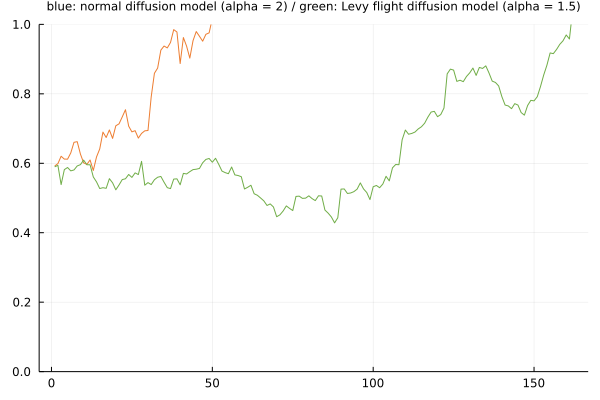

In [10]:
# Plot single trials: Gaussian vs. Levy (alpha=1.5) noise

normal_data = Any[]
for i in 1:1
    trial = plot_levy_trial(1.0, 0.5, 2.0, 0.5, 2.0, 0.3, 0.7, 0.2)
    push!(normal_data, trial)
end

levy_data = Any[]
for i in 1:1
    trial = plot_levy_trial(1.0, 0.5, 2.0, 0.5, 1.5, 0.3, 0.7, 0.2)
    push!(levy_data, trial)
end

plot(normal_data, color="#ED7D31", ylims=(0, 1), label="", title="blue: normal diffusion model (alpha = 2) / green: Levy flight diffusion model (alpha = 1.5)", titlefontsize=8)
plot!(levy_data, color="#70AD47", label="")


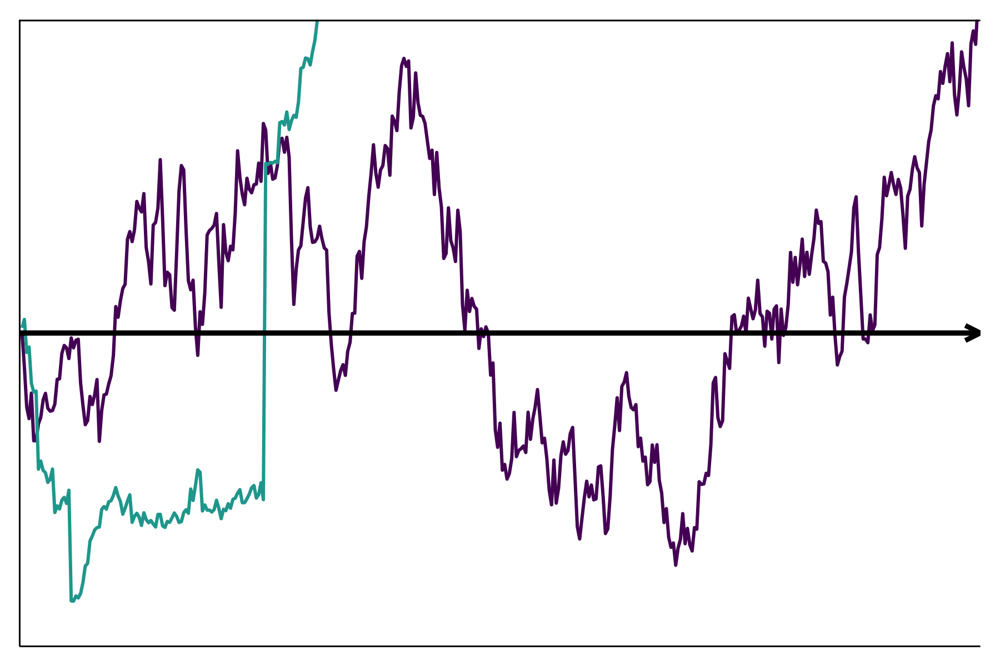

In [271]:
Random.seed!(68)

normal_trial = plot_levy_trial(1.0, 0.5, 2.5, 0.5, 2.0, 0.0, 0.0, 0.0)
levy_trial = plot_levy_trial(1.0, 0.5, 2.5, 0.5, 1.5, 0.0, 0.0, 0.0)

plot(normal_trial, color="#440154FF", lw=2, xlim=(0,Inf), ylims=(0, 1), ticks=false, label=false, dpi=300)
plot!(levy_trial, color="#1F968BFF", lw=2, label=false)
hline!([1], color=:black, lw=2, label=false)
plot!([0,410], [0.5,0.5], arrow=true, color=:black, lw=3, label="")

In [272]:
savefig("normal_vs_levy_noise.png")

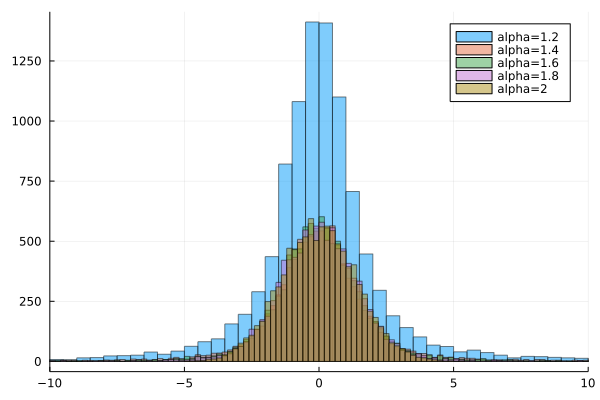

In [4]:
# Plot alpha stable dist for different values of alpha (varying heavyness of tails)

histogram(rand(AlphaStable(α=1.2, β=0.0, scale=1.0, location=0.0), 10000), alpha=0.5, xlims=(-10, 10),label="alpha=1.2")
histogram!(rand(AlphaStable(α=1.4, β=0.0, scale=1.0, location=0.0), 10000), alpha=0.5, label="alpha=1.4")
histogram!(rand(AlphaStable(α=1.6, β=0.0, scale=1.0, location=0.0), 10000), alpha=0.5, label="alpha=1.6")
histogram!(rand(AlphaStable(α=1.8, β=0.0, scale=1.0, location=0.0), 10000), alpha=0.5, label="alpha=1.8")
histogram!(rand(AlphaStable(α=2.0, β=0.0, scale=1.0, location=0.0), 10000), alpha=0.5, label="alpha=2")

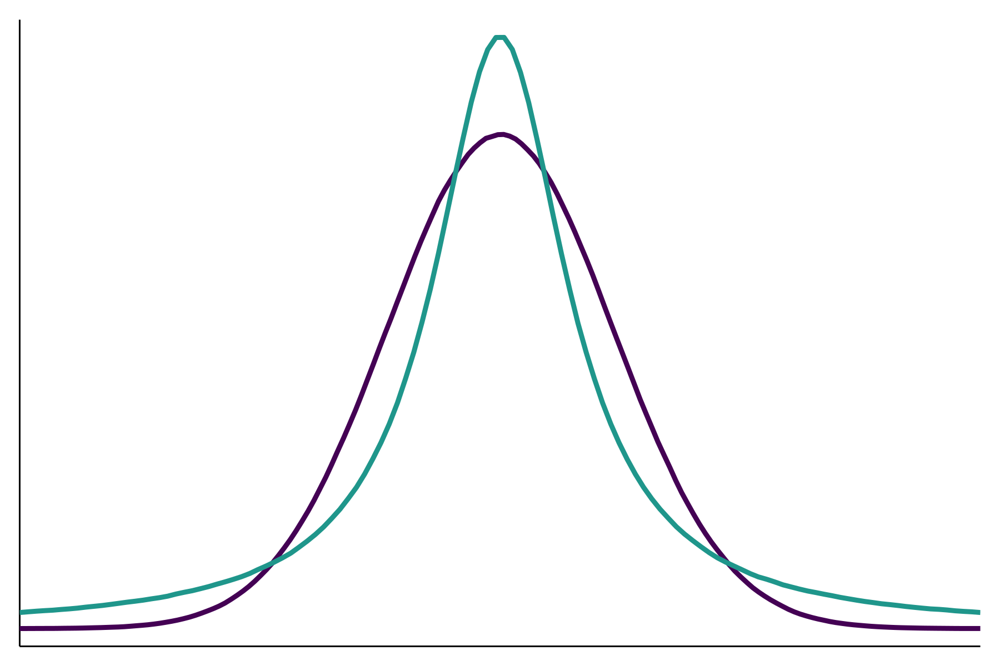

In [237]:
using StatsPlots

density(filter(x -> 10 > x > -10, rand(AlphaStable(α=2.0, β=0.0, scale=1.0, location=0.0), 10000000)), xlims=(-6, 6), color="#440154FF", lw=3, ticks=false, label=false, dpi=300)
density!(filter(x -> 10 > x > -10,rand(AlphaStable(α=1.0, β=0.0, scale=1.0, location=0.0), 10000000)), color="#1F968BFF", lw=3, label=false)

In [233]:
savefig("normal_vs_levy_dist.png")